In [4]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
from strikes import StrikesAnalyzer
import sys
sys.path += ['../Arena']
from explore import ExperimentAnalyzer
import config

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
config.explore_experiment_dir = '/data/Pogona_Pursuit/Arena/experiments'

In [17]:
exps

animal_id  num_of_strikes  \
experiment                        trial                              
worm_20201101T102025              2              6               1   
worm_circle_20201101T112750       1              6               1   
red_beetle_circle_20201101T132007 1              4               1   
                                  2              4               8   
                                  5              4              14   
...                                            ...             ...   
circle_20201129T150448            2              2               1   
                                  3              2               2   
green_beetle_20201130T114041      1              9               2   
worm_20201130T153105              2              6               1   
worm_20201130T162005              1              6               2   

                                        strike_accuracy reward_accuracy  \
experiment                        trial                                   
worm_20201101T102025              2                0.0%          100.0%   
worm_circle_20201101T112750       1                0.0%            0.0%   
red_beetle_circle_20201101T132007 1                0.0%          100.0%   
                                  2                0.0%           50.0%   
                                  5                0.0%            7.1%   
...                                                 ...             ...   
circle_20201129T150448            2              100.0%          100.0%   
                                  3              100.0%          100.0%   
green_beetle_20201130T114041      1              100.0%          100.0%   
worm_20201130T153105              2                0.0%          100.0%   
worm_20201130T162005              1              100.0%            0.0%   

                                                 trial_start  \
experiment                        trial                        
worm_20201101T102025              2      2020-11-01 12:28:25   
worm_circle_20201101T112750       1      2020-11-01 13:28:20   
red_beetle_circle_20201101T132007 1      2020-11-01 15:20:37   
                                  2      2020-11-01 15:28:52   
                                  5      2020-11-01 15:54:58   
...                                                      ...   
circle_20201129T150448            2      2020-11-29 17:12:52   
                                  3      2020-11-29 17:19:23   
green_beetle_20201130T114041      1      2020-11-30 13:41:11   
worm_20201130T153105              2      2020-11-30 17:35:38   
worm_20201130T162005              1      2020-11-30 18:20:35   

                                         time_to_first_strike bug_speed  \
experiment                        trial                                   
worm_20201101T102025              2                     303.0         4   
worm_circle_20201101T112750       1                      18.0         3   
red_beetle_circle_20201101T132007 1                       2.0         3   
                                  2                      11.0         3   
                                  5                      20.0         3   
...                                                       ...       ...   
circle_20201129T150448            2                      23.0         4   
                                  3                      41.0         4   
green_beetle_20201130T114041      1                      32.0         2   
worm_20201130T153105              2                      39.0         2   
worm_20201130T162005              1                      27.0         2   

                                        movement_type  \
experiment                        trial                 
worm_20201101T102025              2            circle   
worm_circle_20201101T112750       1            circle   
red_beetle_circle_20201101T132007 1            circle   
                                  2            circle   
   

In [12]:
exp_trials = []
res = []
ea = ExperimentAnalyzer(start_date='20201101', end_date='20201202', num_of_strikes=1)
exps = ea.get_experiments()
for exp, trial in exps.index:
    try:
        sa = StrikesAnalyzer(exp, trial, 'realtime')
        xf = sa.get_strikes_pose()
        res.append(sa.balistic_analysis())
        exp_trials.append((exp, trial))
    except Exception as exc:
        print(f"Error with {exp} trial {trial}: {exc}")

experiments folder: /data/Pogona_Pursuit/Arena/experiments
Error loading green_beetle_circle_20201118T124412; Missing column provided to 'parse_dates': 'time'
Error loading circle_20201129T144318; Missing column provided to 'parse_dates': 'time'
Error with worm_20201101T102025 trial 2: no bug trajectory file
Error with worm_circle_20201101T112750 trial 1: no bug trajectory file
Error with red_beetle_circle_20201101T132007 trial 1: 'NoneType' object has no attribute 'exists'
Error with red_beetle_circle_20201101T132007 trial 2: 'NoneType' object has no attribute 'exists'
Error with red_beetle_circle_20201101T132007 trial 5: 'NoneType' object has no attribute 'exists'
Error with red_beetle_20201101T141238 trial 1: no bug trajectory file
Error with red_beetle_20201101T143002 trial 1: 'NoneType' object has no attribute 'exists'
Error with red_beetle_20201101T143002 trial 2: 'NoneType' object has no attribute 'exists'
Error with red_beetle_20201101T145453 trial 1: 'NoneType' object has no a

In [31]:
exp_trials

[('green_beetle_20201115T094600', 1),
 ('green_beetle_20201115T094811', 1),
 ('green_beetle_20201115T095104', 1),
 ('green_beetle_20201115T095311', 1),
 ('green_beetle_20201115T095914', 1),
 ('green_beetle_20201115T100523', 1),
 ('green_beetle_20201115T101547', 1),
 ('green_beetle_20201115T102750', 1),
 ('worm_circle_20201115T111625', 1),
 ('worm_circle_20201115T113006', 1),
 ('worm_20201130T162005', 1)]

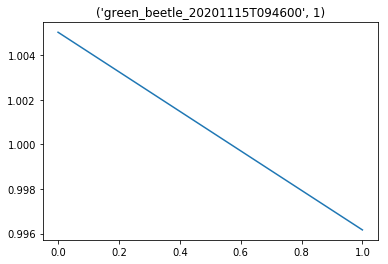

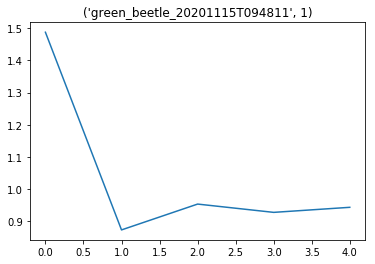

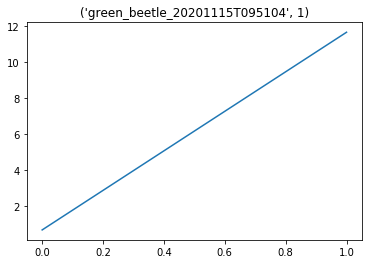

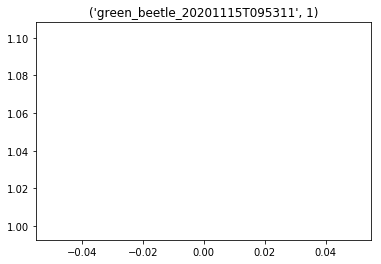

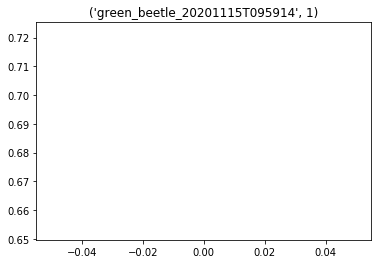

...

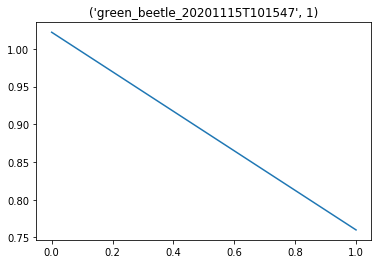

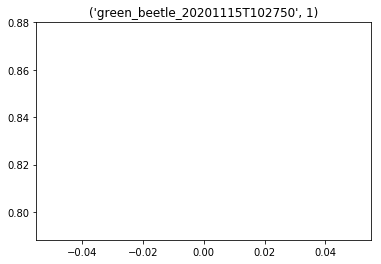

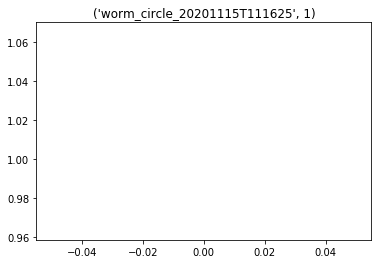

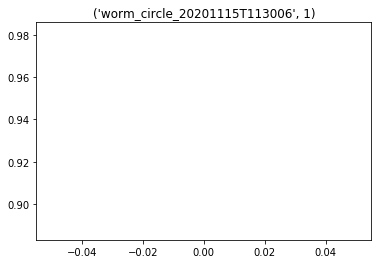

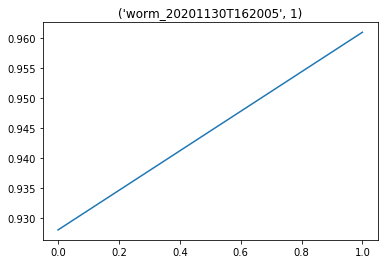

In [26]:
%matplotlib inline
for name, r in zip(exp_trials, res):
    plt.plot(r)
    plt.title(name)
    plt.show()

In [21]:
r

[1.0050268428102935,
 0.9961673063661518,
 1.4871434577636742,
 0.873840227924037,
 0.9540136227862829,
 0.9282841755750129,
 0.9439717874856405,
 0.6750005468956275,
 11.639082841943052,
 1.0504428169606692,
 0.6874900182593667,
 0.946891130465553,
 1.0218761970346015,
 0.7600216574344031,
 0.8341186312781537,
 1.0141899582521332,
 0.9344876017927648,
 0.9279865084319685,
 0.9609209893116354]

In [11]:
circ_res = res.copy()

In [2]:
%%time
sa = StrikesAnalyzer('green_beetle_20201115T094811', 1, 'realtime')
xf = sa.get_strikes_pose()

CPU times: user 2min 4s, sys: 27.2 s, total: 2min 31s
Wall time: 2min 30s


In [3]:
len(xf[0])

301

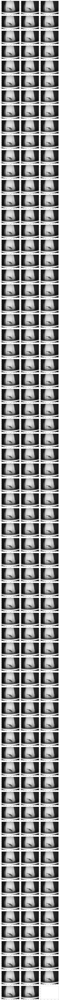

In [8]:
sa.play_strike(xf[1], 200)

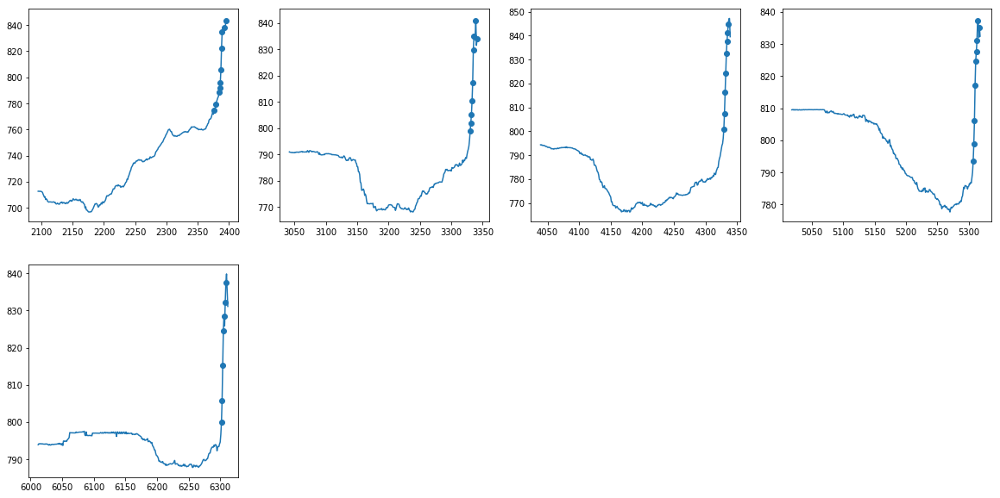

In [5]:
%matplotlib inline
plt.figure(figsize=(20,10))
th = 2.5
for i, x in enumerate(xf):
    plt.subplot(int(np.ceil(len(xf)/4)),4,i+1)
    y = x['nose'].y
    plt.plot(y)
    d = y.diff()
    idx = d[d > th].index
#     print(d[idx])
    plt.scatter(idx, y[idx])

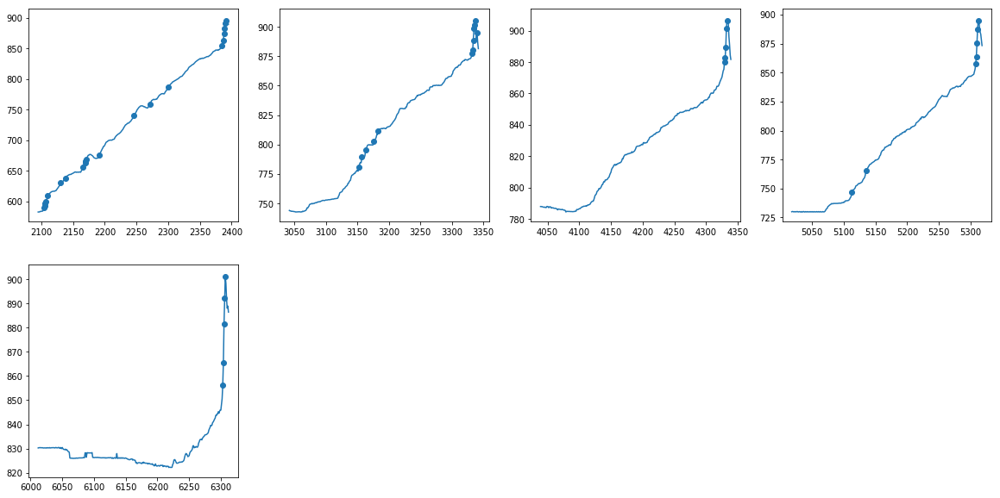

In [6]:
%matplotlib inline
plt.figure(figsize=(20,10))
th = 2.5
for i, x in enumerate(xf):
    plt.subplot(int(np.ceil(len(xf)/4)),4,i+1)
    y = x['nose'].x
    plt.plot(y)
    d = y.diff()
    idx = d[d > th].index
#     print(d[idx])
    plt.scatter(idx, y[idx])

In [35]:
sa.balistic_analysis()

[1.4871434577636742,
 0.873840227924037,
 0.9540136227862829,
 0.9282841755750129,
 0.9439717874856405]

In [82]:
sa.get_frames_timestamps()[33]

'2020-11-15 09:48:11.979785204'

In [63]:
pd.MultiIndex.from_product([['x', 'y'],zf.index])add_prefix
# zf.set_multiIndex()

MultiIndex([('x',      'nose'),
            ('x',  'left_ear'),
            ('x', 'right_ear'),
            ('y',      'nose'),
            ('y',  'left_ear'),
            ('y', 'right_ear')],
           )

,x,y,prob
nose,728.788330,874.215210,0.999994
left_ear,772.265625,781.232483,0.999901
right_ear,NaN,NaN,0.735015


In [51]:
video = '/data/Pogona_Pursuit/Arena/experiments/green_beetle_20201026T135647/trial1/videos/20201026-135647/19506455.avi'

In [10]:
deeplabcut.evaluate_network(path_config_file, plotting=True)

/media/sil2/tomer/realtime_dlc-tomer_oded-2020-08-24/evaluation-results/  already exists!
/media/sil2/tomer/realtime_dlc-tomer_oded-2020-08-24/evaluation-results/iteration-2/realtime_dlcAug24-trainset95shuffle1  already exists!
Running  DLC_resnet50_realtime_dlcAug24shuffle1_600000  with # of trainingiterations: 600000
Initializing ResNet


0it [00:00, ?it/s]

Analyzing data...


274it [00:49,  5.52it/s]
  0%|          | 0/274 [00:00<?, ?it/s]

Done and results stored for snapshot:  snapshot-600000
Results for 600000  training iterations: 95 1 train error: 2.03 pixels. Test error: 2.2  pixels.
With pcutoff of 0.6  train error: 2.03 pixels. Test error: 2.2 pixels
Thereby, the errors are given by the average distances between the labels by DLC and the scorer.
Plotting...


100%|██████████| 274/274 [03:13<00:00,  1.42it/s]

The network is evaluated and the results are stored in the subdirectory 'evaluation_results'.
If it generalizes well, choose the best model for prediction and update the config file with the appropriate index for the 'snapshotindex'.
Use the function 'analyze_video' to make predictions on new videos.
Otherwise consider retraining the network (see DeepLabCut workflow Fig 2)


In [50]:
deeplabcut.analyze_videos(path_config_file, videos, videotype='avi', gputouse=0, save_as_csv=True)

FileNotFoundError: It seems the model for shuffle 1 and trainFraction 0.95 does not exist.

In [12]:
deeplabcut.create_labeled_video(path_config_file,[video], videotype='avi', draw_skeleton=True, trailpoints=10)

/media/sil2/regev/Pogona_Pursuit/Arena/experiments/initial_20201021T100551/trial4/videos/20201021-102825  already exists!
Starting to process video: /media/sil2/regev/Pogona_Pursuit/Arena/experiments/initial_20201021T100551/trial4/videos/20201021-102825/19506475.avi
Loading /media/sil2/regev/Pogona_Pursuit/Arena/experiments/initial_20201021T100551/trial4/videos/20201021-102825/19506475.avi and data.
Duration of video [s]: 146.85, recorded with 60.0 fps!
Overall # of frames: 8811 with cropped frame dimensions: 1440 1080
Generating frames and creating video.


  0%|          | 0/8811 [00:00<?, ?it/s]/home/regev/anaconda3/envs/dlc/lib/python3.6/site-packages/deeplabcut/utils/make_labeled_video.py:172: FutureWarning: circle is deprecated in favor of disk.circle will be removed in version 0.19
  df_y[ind, index], df_x[ind, index], dotsize, shape=(ny, nx)
/home/regev/anaconda3/envs/dlc/lib/python3.6/site-packages/deeplabcut/utils/make_labeled_video.py:168: FutureWarning: circle is deprecated in favor of disk.circle will be removed in version 0.19
  shape=(ny, nx),
100%|██████████| 8811/8811 [02:32<00:00, 57.75it/s]


In [2]:
# export model
import deeplabcut
path_config_file = '/data/pose_estimation/deeplabcut/projects/pogona_pursuit-regev-2020-07-19/config.yaml'
deeplabcut.export_model(path_config_file, iteration=1, shuffle=1, trainingsetindex=0, snapshotindex=None, TFGPUinference=True, overwrite=False, make_tar=True)

Initializing ResNet
Instructions for updating:
Colocations handled automatically by placer.


Instructions for updating:
Colocations handled automatically by placer.


Instructions for updating:
Use standard file APIs to check for files with this prefix.


Instructions for updating:
Use standard file APIs to check for files with this prefix.


INFO:tensorflow:Restoring parameters from /data/pose_estimation/deeplabcut/projects/pogona_pursuit-regev-2020-07-19/dlc-models/iteration-1/pogona_pursuitJul19-trainset95shuffle1/train/snapshot-800000


INFO:tensorflow:Restoring parameters from /data/pose_estimation/deeplabcut/projects/pogona_pursuit-regev-2020-07-19/dlc-models/iteration-1/pogona_pursuitJul19-trainset95shuffle1/train/snapshot-800000


Instructions for updating:
Use tf.gfile.GFile.


Instructions for updating:
Use tf.gfile.GFile.


INFO:tensorflow:Restoring parameters from /data/pose_estimation/deeplabcut/projects/pogona_pursuit-regev-2020-07-19/dlc-models/iteration-1/pogona_pursuitJul19-trainset95shuffle1/train/snapshot-800000


INFO:tensorflow:Restoring parameters from /data/pose_estimation/deeplabcut/projects/pogona_pursuit-regev-2020-07-19/dlc-models/iteration-1/pogona_pursuitJul19-trainset95shuffle1/train/snapshot-800000


Instructions for updating:
Use tf.compat.v1.graph_util.convert_variables_to_constants


Instructions for updating:
Use tf.compat.v1.graph_util.convert_variables_to_constants


Instructions for updating:
Use tf.compat.v1.graph_util.extract_sub_graph


Instructions for updating:
Use tf.compat.v1.graph_util.extract_sub_graph


INFO:tensorflow:Froze 269 variables.


INFO:tensorflow:Froze 269 variables.


INFO:tensorflow:Converted 269 variables to const ops.


INFO:tensorflow:Converted 269 variables to const ops.


In [58]:


config = yaml.load(open(path_config_file))

/home/user/miniconda/envs/dlc/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


In [56]:
%time
pred = dlc_live.get_pose(frame)

CPU times: user 11 µs, sys: 2 µs, total: 13 µs
Wall time: 25.3 µs


In [113]:
from IPython.display import display, clear_output, Image
import cv2
from io import BytesIO
import PIL

# Use 'jpeg' instead of 'png' (~5 times faster)
def showarray(a, fmt='jpeg'):
    f = BytesIO()
    PIL.Image.fromarray(a).save(f, fmt)

    display(Image(data=f.getvalue()))

In [116]:
try:
    while True:
        # Capture frame-by-frame
        ret, frame = cap.read()
        pred = dlc_live.get_pose(frame)
        df = pd.DataFrame(pred, index=config['bodyparts'], columns=['x', 'y', 'prob'])
        # Convert the image from OpenCV BGR format to matplotlib RGB format
        # to display the image
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        for pt, color in [('nose', [255,0,0]), ('left_ear', [0,255,0]), ('right_ear', [0,0,255])]:
            ct = tuple([round(x) for x in df.loc[pt, ['x', 'y']].to_list()])
            frame = cv2.circle(frame, ct, 2, color, 1)
        showarray(frame)

        # Display the frame until new frame is available
        clear_output(wait=True)

except KeyboardInterrupt:
#     cam.release()
    print("Stream stopped")

Stream stopped


In [5]:
from pathlib import Path
import re

In [10]:
l = list(Path('/data/Pogona_Pursuit/Arena/experiments').glob('*'))
len(l)

471

In [13]:
l[0]

PosixPath('/data/Pogona_Pursuit/Arena/experiments/initial_20200727T071226')

In [22]:
counter = 0
no_videos_exp = []
for p in Path('/data/Pogona_Pursuit/Arena/experiments').glob('*'):
    if not re.match(r'.+_\d{8}T\d{6}', p.name):
        continue
    
    if list(p.rglob('bug_trajectory.csv')):
        counter += 1
#     videos = [v for v in p.rglob('*') if v.suffix in ['.mp4', '.avi']]
#     if not videos:
#         no_videos_exp += 1
counter

251

In [24]:
list(exp_path.rglob('*.mp4'))[0].suffix

'.mp4'

In [2]:
import shutil

In [6]:
videos = Path('../Arena/experiments').rglob('realtime_*.mp4')

In [7]:
v = next(videos)
v

PosixPath('../Arena/experiments/green_beetle_circle_20201118T124412/trial1/videos/realtime_20201118T124413.mp4')

In [21]:
for p in Path('/data/Pogona_Pursuit/Arena/experiments').glob('delete*'):
    print(p.name)
#     shutil.rmtree(p.as_posix())

In [15]:
shutil.rmtree(d.as_posix())

In [51]:
v

PosixPath('../Arena/experiments/green_beetle_20201115T094811/trial1/videos/realtime_20201115T094811.avi')

In [72]:
CAMERAS = {
    'realtime': '19506468',
    'right': '19506475',
    'left': '19506455',
    'back': '19506481',
}

parents = set()
for v in Path('../Arena/experiments').rglob('*.avi'): 
    camera = None
    for name, serial in CAMERAS.items():
        if v.stem == serial:
            camera = name
    if not camera:
        continue
    
    parents.add(v.parent.as_posix())
    new_name = f"{camera}_{v.parts[-2].replace('-','T')}.avi"
    shutil.move(v.as_posix(), (v.parent.parent / new_name).as_posix())
    if (v.parent / 'output.log').exists():
        shutil.move((v.parent / 'output.log').as_posix(), v.parent.parent.as_posix())
    print(f"{v.name} -> {new_name}")

19506468.avi -> realtime_20200727T073709.avi
19506475.avi -> right_20200727T073709.avi
19506468.avi -> realtime_20200727T074341.avi
19506475.avi -> right_20200727T074341.avi
19506475.avi -> right_20200727T075013.avi
19506468.avi -> realtime_20200727T075013.avi
19506468.avi -> realtime_20200727T080358.avi
19506475.avi -> right_20200727T080358.avi
19506468.avi -> realtime_20200727T081031.avi
19506475.avi -> right_20200727T081031.avi
19506475.avi -> right_20200727T081705.avi
19506468.avi -> realtime_20200727T081705.avi
19506475.avi -> right_20200727T082337.avi
19506468.avi -> realtime_20200727T082337.avi
19506468.avi -> realtime_20200727T083455.avi
19506475.avi -> right_20200727T083455.avi
19506468.avi -> realtime_20200727T100404.avi
19506475.avi -> right_20200727T100404.avi
19506468.avi -> realtime_20200727T102701.avi
19506475.avi -> right_20200727T102701.avi
19506475.avi -> right_20200727T103334.avi
19506468.avi -> realtime_20200727T103334.avi
19506475.avi -> right_20200727T104006.avi
1

In [85]:
for pt in parents:
    p = Path(pt)
#     if (p / 'timestamps').exists():
#         shutil.move((p / 'timestamps').as_posix(), (p.parent / 'timestamps').as_posix())
#     break

    if list(p.glob('*')):
        print(p.name)
        print(list(p.glob('*')))
        print()

20200907-145106
[PosixPath('../Arena/experiments/circle_20200907T145105/trial1/videos/20200907-145106/.ipynb_checkpoints')]

20200727-102701
[PosixPath('../Arena/experiments/test_fps_20200727T102701/trial1/videos/20200727-102701/19506468DLC_resnet50_pogona_pursuitJul19shuffle1_400000.csv'), PosixPath('../Arena/experiments/test_fps_20200727T102701/trial1/videos/20200727-102701/19506468DLC_resnet50_pogona_pursuitJul19shuffle1_400000.h5'), PosixPath('../Arena/experiments/test_fps_20200727T102701/trial1/videos/20200727-102701/19506468DLC_resnet50_pogona_pursuitJul19shuffle1_400000_meta.pickle'), PosixPath('../Arena/experiments/test_fps_20200727T102701/trial1/videos/20200727-102701/19506475DLC_resnet50_pogona_pursuitJul19shuffle1_400000.csv'), PosixPath('../Arena/experiments/test_fps_20200727T102701/trial1/videos/20200727-102701/19506475DLC_resnet50_pogona_pursuitJul19shuffle1_400000.h5'), PosixPath('../Arena/experiments/test_fps_20200727T102701/trial1/videos/20200727-102701/19506475DLC_res

In [87]:
v

PosixPath('../Arena/experiments/green_beetle_20201115T094811/trial1/videos/realtime_20201115T094811.avi')

In [8]:
from loader import Loader

In [18]:
ld = Loader(video_path=v)

Error loading bug trajectory; Missing column provided to 'parse_dates': 'time'


In [17]:
len(ld.traj_df)

0

In [13]:
pd.read_csv(ld.bug_traj_path, index_col=0).reset_index(drop=True) #, parse_dates=['time']

""


In [15]:
ld.bug_traj_path.exists()

True

In [28]:
# good_videos = []
for v in [x for x in Path('../Arena/experiments').rglob('realtime_*') if x.suffix in ['.avi', '.mp4']]:
    try:
        ld = Loader(video_path=v)
        if len(ld.hits_df) > 1:
            good_videos.append(v)
    except Exception as exc:
#         print(exc)
        continue

good_videos

[PosixPath('../Arena/experiments/green_beetle_20201115T100523/trial1/videos/realtime_20201115T100523.mp4'),
 PosixPath('../Arena/experiments/green_beetle_20201115T101547/trial1/videos/realtime_20201115T101547.mp4'),
 PosixPath('../Arena/experiments/line_20201116T113141/trial1/videos/realtime_20201116T113141.mp4'),
 PosixPath('../Arena/experiments/green_beetle_circle_20201118T125906/trial1/videos/realtime_20201118T125907.mp4'),
 PosixPath('../Arena/experiments/green_beetle_20201115T102750/trial1/videos/realtime_20201115T102751.mp4'),
 PosixPath('../Arena/experiments/worm_20201118T143919/trial1/videos/realtime_20201118T143919.mp4'),
 PosixPath('../Arena/experiments/worm_circle_20201115T111625/trial1/videos/realtime_20201115T111625.mp4'),
 PosixPath('../Arena/experiments/worm_circle_20201115T113006/trial1/videos/realtime_20201115T113006.mp4'),
 PosixPath('../Arena/experiments/green_beetle_20201115T095311/trial1/videos/realtime_20201115T095311.mp4'),
 PosixPath('../Arena/experiments/green_

In [25]:
good_videos

[PosixPath('../Arena/experiments/green_beetle_20201115T100523/trial1/videos/realtime_20201115T100523.mp4'),
 PosixPath('../Arena/experiments/green_beetle_20201115T101547/trial1/videos/realtime_20201115T101547.mp4'),
 PosixPath('../Arena/experiments/line_20201116T113141/trial1/videos/realtime_20201116T113141.mp4'),
 PosixPath('../Arena/experiments/green_beetle_circle_20201118T125906/trial1/videos/realtime_20201118T125907.mp4'),
 PosixPath('../Arena/experiments/green_beetle_20201115T102750/trial1/videos/realtime_20201115T102751.mp4'),
 PosixPath('../Arena/experiments/worm_20201118T143919/trial1/videos/realtime_20201118T143919.mp4'),
 PosixPath('../Arena/experiments/worm_circle_20201115T111625/trial1/videos/realtime_20201115T111625.mp4'),
 PosixPath('../Arena/experiments/worm_circle_20201115T113006/trial1/videos/realtime_20201115T113006.mp4'),
 PosixPath('../Arena/experiments/green_beetle_20201115T095311/trial1/videos/realtime_20201115T095311.mp4'),
 PosixPath('../Arena/experiments/green_